## Imports and helper functions

In [1]:
# connecting drive to colab notebook
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from datetime import date
import torchvision
import numpy as np
import torch
import argparse
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow
import torch.nn as nn
from collections import OrderedDict
import torch.optim as optim
import time
import copy
import torchvision.transforms as transforms
from torchvision.io.image import read_image
from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights
from torchvision.transforms.functional import to_pil_image
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torch.autograd import Variable
import matplotlib.pyplot as plt

from scipy.interpolate import LinearNDInterpolator
from scipy.interpolate import NearestNDInterpolator, CloughTocher2DInterpolator

import sys
sys.path.append('/content/drive/My Drive/drive_folder')
from custom_dataset_loader import TaiChiDataset, ToTensor
from helper_functions import set_parameter_requires_grad, meshgrid2d, get_grid, plot_learning_curve, split_dataset, initialise_model, get_predictions

In [3]:
from scipy.interpolate import LinearNDInterpolator
from scipy.interpolate import NearestNDInterpolator
import numpy as np
import matplotlib.pyplot as plt

In [4]:
def show_coords(true_c, true_v):
  true_v = true_v <= 0
  plt.scatter(true_c[:, 0], true_c[:, 1], s=0.5, marker='.', c=true_v, cmap=plt.cm.coolwarm)
  plt.ylim(360, 0)
  plt.title('True Coords')
  plt.show()


In [5]:
def reconstruct_frame(img0, coords, vis, last_img):
  img0=img0.permute(1, 2, 0).numpy() # H, W, C
  last_img=last_img.permute(1, 2, 0).numpy() # H, W, C
  interpolated_img = interpolate(img0, coords, vis)

  plt.imshow(img0)
  plt.title("First Frame")
  plt.show()
  plt.imshow(last_img)
  plt.title("Last Frame")
  plt.show()
  plt.imshow(interpolated_img)
  plt.title("Reconstructed Frame")
  plt.show()

In [6]:
def get_dataloader(dataset, batch_size=16, shuffle=True):
  dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=0)
  return dataloader

In [7]:
def interpolate(img0, coords, vis, full=False):
  # Make grid
  if full:
    h = np.arange(0, 360) # Take linspace of H of the image
    w = np.arange(0, 640) # Take linspace of W of the image
    w, h = np.meshgrid(w, h)
    original_x = h.flatten()
    original_y = w.flatten()
    
  else:
    original_points = get_grid(device, 4096, 1, 360, 640)
    original_points = original_points.view(1, 1, -1, 2).squeeze().flatten().cpu().numpy()
    original_x = original_points[1::2]
    original_y = original_points[::2]



  vis = vis.squeeze() > 0

  original_x = original_x[vis]
  original_y = original_y[vis]

  coords = coords.squeeze()
  
  coords_x = coords[:, 1]
  coords_y = coords[:, 0]

  coords_x = coords_x[vis]
  coords_y = coords_y[vis]


  if full:
    coords_x = (original_x+coords_x).astype(int)
    coords_y = (original_y+coords_y).astype(int)


  # Take RGB values of tracked points
  # from the input image take RGB values of original grid points
  z = img0
  z_R = []
  z_G = []
  z_B = []

  for point in list(zip(original_x, original_y)):
    x, y = point
    x = int(x)
    y = int(y)
    z_R.append(img0[x, y, 0]) #(360,640,3)
    z_G.append(img0[x, y, 1])
    z_B.append(img0[x, y, 2])
  

  X = np.arange(0, 360) # Take linspace of H of the image
  Y = np.arange(0, 640) # Take linspace of W of the image
  X, Y = np.meshgrid(X, Y)  # 2D grid for interpolation

  points = list(zip(coords_x, coords_y))


  interp_R_NN = NearestNDInterpolator(points, z_R) # predicted point coord -> R-intensity
  interp_G_NN = NearestNDInterpolator(points, z_G) # predicted point coord -> G-intensity
  interp_B_NN = NearestNDInterpolator(points, z_B) # predicted point coord -> B-intensity

  interp_R = CloughTocher2DInterpolator(points, z_R) # predicted point coord -> R-intensity
  interp_G = CloughTocher2DInterpolator(points, z_G) # predicted point coord -> G-intensity
  interp_B = CloughTocher2DInterpolator(points, z_B) # predicted point coord -> B-intensity

  # interpolate the whole 2d grid
  Z_R = interp_R(X, Y) 
  Z_G = interp_G(X, Y)
  Z_B = interp_B(X, Y)

  Z_R_NN = interp_R_NN(X, Y) 
  Z_G_NN = interp_G_NN(X, Y)
  Z_B_NN = interp_B_NN(X, Y)

  concateneted = np.stack([Z_R, Z_G, Z_B])
  concateneted_NN = np.stack([Z_R_NN, Z_G_NN, Z_B_NN])

  img = concateneted
  img_NN = concateneted_NN

  # Replace NaN values in img with values in img_NN
  replace_nans = np.where(np.isnan(img), img_NN, img)
  reconstruction = replace_nans
  reconstruction = np.clip(replace_nans, 0, 1)

  reconstruction = reconstruction.transpose(2, 1, 0)
  reconstruction_NN = img_NN.transpose(2, 1, 0)
  return reconstruction, reconstruction_NN

In [8]:
def plot_results(frame0, frame7, pred_c, pred_v, true_c, true_v, full_coords, full_vis):
  fig, ((ax1, ax2),(ax3, ax4), (ax5, ax6), (ax7, ax8), (ax9, ax10)) = plt.subplots(5, 2, figsize=(12, 20))

  ax1.imshow(frame0)
  ax1.set_title('First frame')
  ax2.imshow(frame7)
  ax2.set_title('Last frame')

  pred_mask = pred_v <= 0
  true_mask = true_v <= 0

  plot_true_c = true_c
  plot_pred_c = pred_c
    
  plot_true_c[ :, 0] = np.where(true_mask, 0, plot_true_c[ :, 0])
  plot_true_c[ :, 1] = np.where(true_mask, 0, plot_true_c[ :, 1])
  plot_pred_c[ :, 0] = np.where(pred_mask, 0, plot_pred_c[ :, 0])
  plot_pred_c[ :, 1] = np.where(pred_mask, 0, plot_pred_c[ :, 1])
  pred_mask = true_mask

  interpolated_img, interpolated_img_NN = interpolate(frame0, full_coords, full_vis, full=True)
  ax5.imshow(interpolated_img)
  ax5.set_title("CT+NN Reconstructed Frame - full output")
  ax6.imshow(interpolated_img_NN)
  ax6.set_title("NN Reconstructed Frame - full output")

  interpolated_img, interpolated_img_NN = interpolate(frame0, pred_c, pred_v)
  ax7.imshow(interpolated_img)
  ax7.set_title("CT+NN Reconstructed Frame - grid")
  ax8.imshow(interpolated_img_NN)
  ax8.set_title("NN Reconstructed Frame - grid")

  interpolated_img, interpolated_img_NN = interpolate(frame0, true_c, true_v)
  ax9.imshow(interpolated_img)
  ax9.set_title("CT+NN Reconstructed Frame - ground truth")
  ax10.imshow(interpolated_img_NN)
  ax10.set_title("NN Reconstructed Frame - ground truth")

  ax3.scatter(plot_true_c[:, 0], plot_true_c[:, 1], s=0.5, marker='.', c=true_mask, cmap=plt.cm.coolwarm)
  ax3.set_ylim(360, 0)
  ax3.set_title('True Coords')

  ax4.scatter(plot_pred_c[:, 0], plot_pred_c[:, 1], s=0.5, marker='.', c=pred_mask, cmap=plt.cm.coolwarm)
  ax4.set_ylim(360, 0)
  ax4.set_title('Predicted Coords')

  plt.show()
  print('-------'*20)

In [9]:
def show_results(pred_coords, pred_vis, true_coords, true_vis, img0, img7, full_coords, full_vis):
  batch_size = pred_coords.shape[0]
  sample_ids = np.arange(batch_size)

  
  for x in sample_ids:
    frame0 = img0[x, :, :, :]
    frame7 = img7[x, :, :, :]

    frame0 = img0[x, :, :, :].cpu().detach().squeeze()
    frame7 = img7[x, :, :, :].cpu().detach().squeeze()

    frame7=frame7.permute(1, 2, 0).numpy()
    frame0=frame0.permute(1, 2, 0).numpy()

    pred_c = pred_coords[x, :, :, :].cpu().detach().numpy().squeeze()
    pred_v = pred_vis[x, :, :].cpu().detach().numpy().squeeze()
    true_c = true_coords[x, :, :, :].cpu().numpy().squeeze()
    true_v = true_vis[x, :, :].cpu().numpy().squeeze()

    full_c = full_coords[x, :, :, :].cpu().detach().numpy().squeeze()
    full_v = full_vis[x, :, :].cpu().detach().numpy().squeeze()


    plot_results(frame0, frame7, pred_c, pred_v, true_c, true_v, full_c, full_v)

## Get dataset

In [ ]:
# Load dataset

TEST_DATA = "synthetic_dataset_test_2023-03-09"
!unzip -d "$TEST_DATA"/ /content/drive/MyDrive/synthetic_dataset/"$TEST_DATA".zip # unziping test data


test_dataset = TaiChiDataset(log_file=TEST_DATA+'/sample_ids.txt',
                              root_dir=TEST_DATA,
                              check=True,
                              transform=transforms.Compose([ToTensor()]))
print(len(test_dataset))

## Load checkpoint and initialise models

In [11]:
# load checkpoint
def load_checkpoint(filename):
  try:
    filepath = "/content/drive/MyDrive/checkpoints/"+filename
    
    checkpoint = torch.load(filepath, map_location='cuda:0')
    
    t_history = checkpoint['train_loss_history']
    v_history = checkpoint['val_loss_history']
    train_time = int(checkpoint['train_time'])

    t_losses = np.array([x[1] for x in t_history])
    v_losses = np.array([x[1] for x in v_history])

   
    t_min_arg = np.argmin(t_losses)
    v_min_arg = np.argmin(v_losses)

    print('-' * 50)
    print("Checkpoint data:")
    print("Best train loss: {:.3f} at epoch {}/{}".format(t_history[t_min_arg][1], t_history[t_min_arg][0], len(t_history)))
    print("Best valid loss: {:.3f} at epoch {}/{}".format(v_history[v_min_arg][1], v_history[v_min_arg][0], len(t_history)))
    print("Train time {}h".format(int(train_time)//3600))
    print('-' * 50)

    model_weights = checkpoint['model_weights']
    best_model_weights = checkpoint['best_weights']
    optimizer_state = checkpoint['optimizer']

    return model_weights, best_model_weights, t_history, v_history
  except Exception as e:
    print("ERROR could not load checkpoint:", e)

In [12]:
def run_model(model, dataloader):
  for i_batch, sample_batched in enumerate(dataloader):
    batch_size = len(sample_batched['id'])

    input1 = sample_batched['image0']
    input2 = sample_batched['image3']
    last_img = sample_batched['image7']
    inputs = torch.cat((input1, input2), dim=1) 

    # Get ground truth coords and vis
    coords = sample_batched['coords']
    vis = torch.where(sample_batched['vis'] > 0, 1.0, 0.0)
              
    inputs = inputs.to(device).float() # torch.Size([B, 6, H, W])
    coords = coords.to(device) # torch.Size([B, 1, 4096, 2])
    vis = vis.to(device) # torch.Size([B, 1, 4096])

    with torch.no_grad():
          # Get model outputs 
          outputs = model(inputs) # torch.Size([B, 3, H, W]) same as inputs shape
          outputs = outputs['out'].to(device)
          outputs_coords = outputs[:, :2, :, :]
          outputs_vis = outputs[:, 2, :, :]
          outputs_coords_grid, outputs_vis_grid = get_predictions(device, outputs, coords, batch_size)

          outputs_coords = torch.permute(outputs_coords, (0, 2, 3, 1))
          outputs_vis = outputs_vis.view(batch_size,1,-1)

          outputs_coords = outputs_coords.view(batch_size,1,-1,2) # torch.Size([B, 1, 64*64, 2])

          outputs_vis_grid = torch.where(outputs_vis_grid>0,1.0,0.0)
    
    return outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis



## Model 1A

--------------------------------------------------
Checkpoint data:
Best train loss: 0.354 at epoch 400/402
Best valid loss: 0.344 at epoch 401/402
Train time 3h
--------------------------------------------------


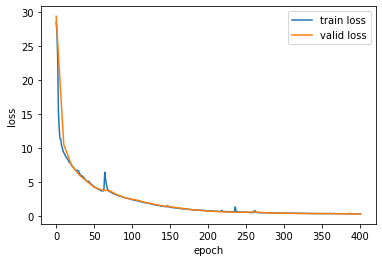

In [14]:
model_weights, best_model_weights, t_history, v_history = load_checkpoint("no_shifting_checkpoint_2023-03-20_1702.pth")
plot_learning_curve(t_history, v_history)

# Set computation device
device = torch.device('cuda')

# MODEL INITIALISATION
model1 = initialise_model(device, to_learn=['all'])
model1.load_state_dict(best_model_weights)
model1.eval()
torch.save(model1, "model1A.pt")

# # DEFINE HYPERPARAMETERS
# shuffle_dataset = True
# B = 16 # Batch size

# # Get train and test dataloaders
# test_loader = get_dataloader(test_dataset)

# outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis = run_model(model1, test_loader)
# show_results(outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis)

## Model 1B

--------------------------------------------------
Checkpoint data:
Best train loss: 1.499 at epoch 437/442
Best valid loss: 1.237 at epoch 402/442
Train time 8h
--------------------------------------------------


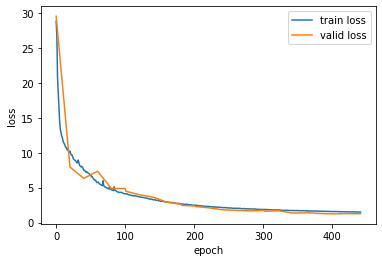

In [15]:
model_weights, best_model_weights, t_history, v_history = load_checkpoint("model_shifting_checkpoint_2023-03-20_2257.pth")
plot_learning_curve(t_history, v_history)

# Set computation device
device = torch.device('cuda')

# MODEL INITIALISATION
model1 = initialise_model(device, to_learn=['all'])
model1.load_state_dict(best_model_weights)
model1.eval()
torch.save(model1, "model1B.pt")

# # DEFINE HYPERPARAMETERS
# shuffle_dataset = True
# B = 16 # Batch size

# # Get train and test dataloaders
# test_loader = get_dataloader(test_dataset)

# outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis = run_model(model1, test_loader)
# show_results(outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis)

## Model 1C

--------------------------------------------------
Checkpoint data:
Best train loss: 1.796 at epoch 497/501
Best valid loss: 1.421 at epoch 500/501
Train time 2h
--------------------------------------------------


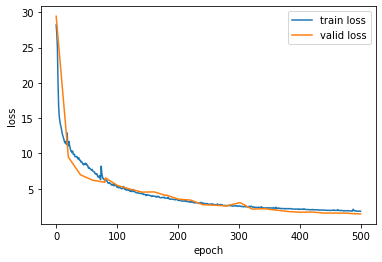

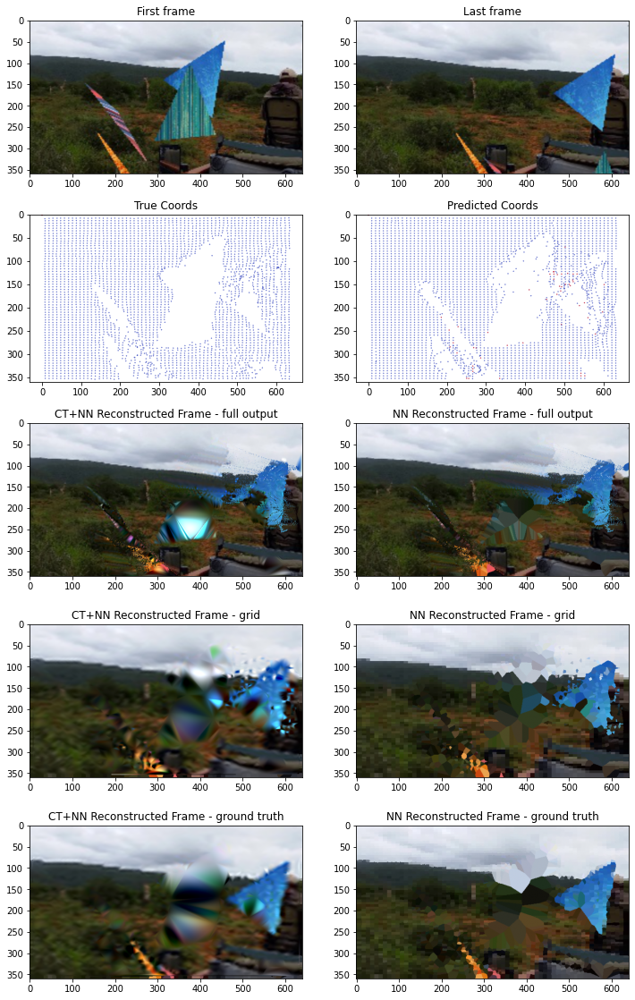

--------------------------------------------------------------------------------------------------------------------------------------------


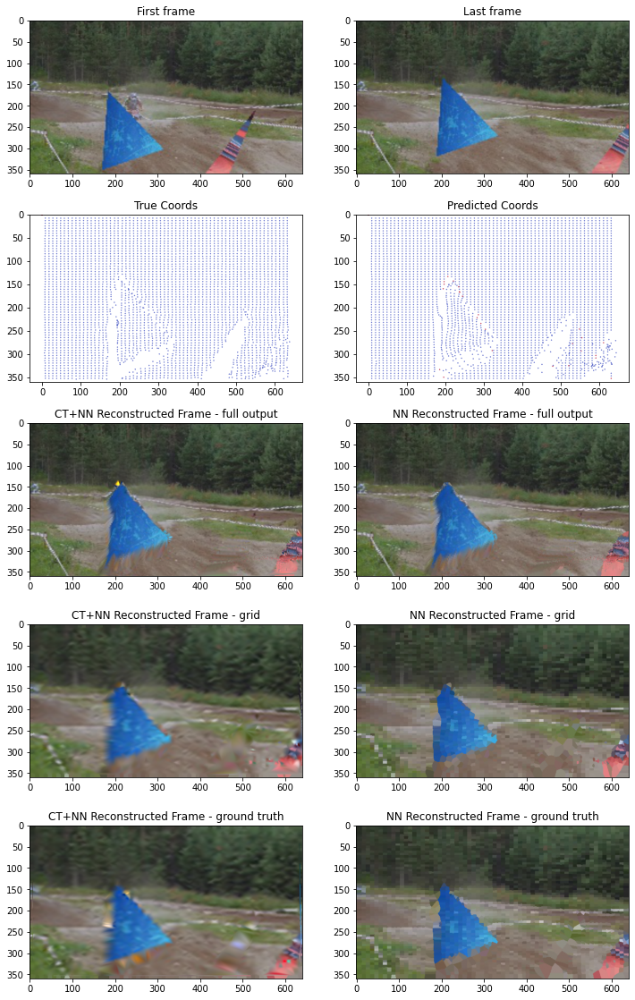

--------------------------------------------------------------------------------------------------------------------------------------------


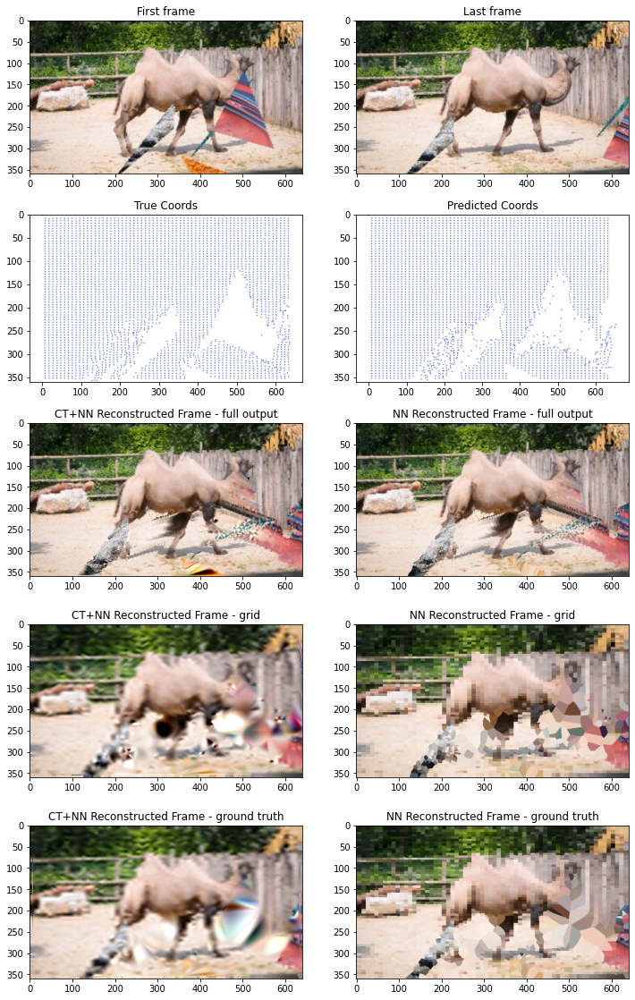

--------------------------------------------------------------------------------------------------------------------------------------------


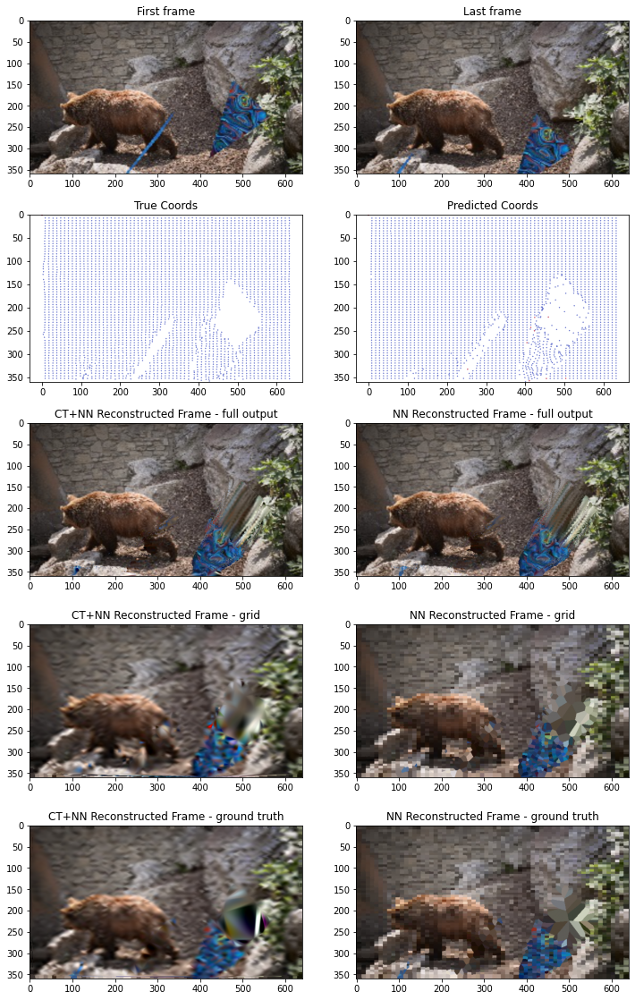

--------------------------------------------------------------------------------------------------------------------------------------------


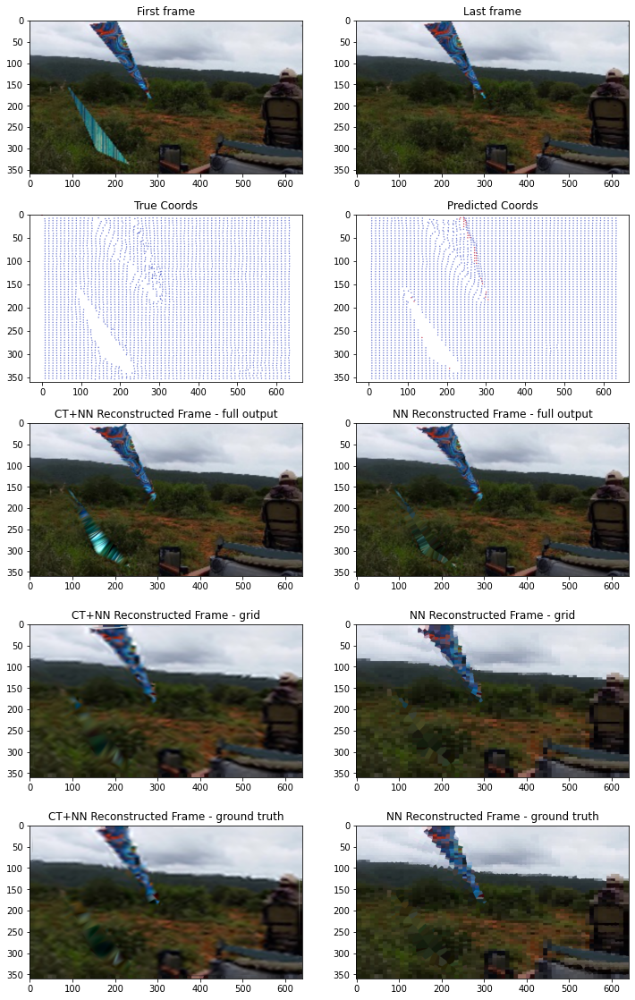

--------------------------------------------------------------------------------------------------------------------------------------------


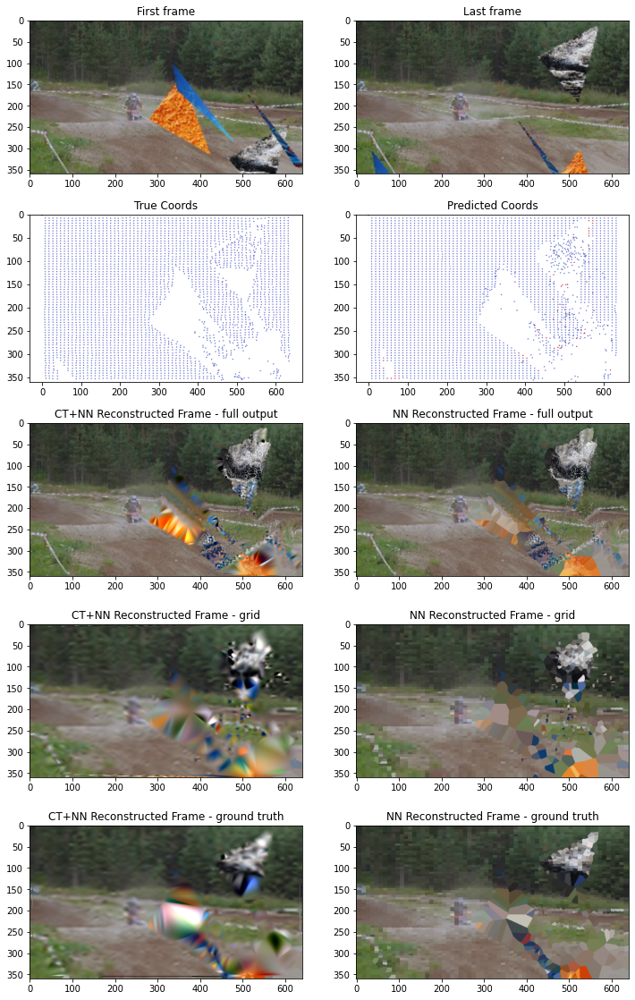

--------------------------------------------------------------------------------------------------------------------------------------------


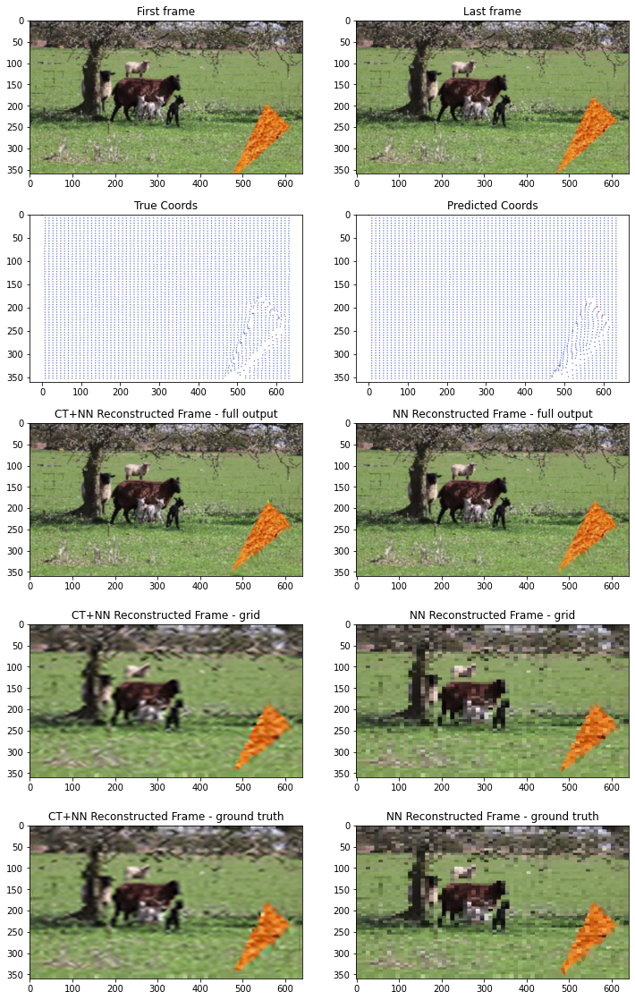

--------------------------------------------------------------------------------------------------------------------------------------------


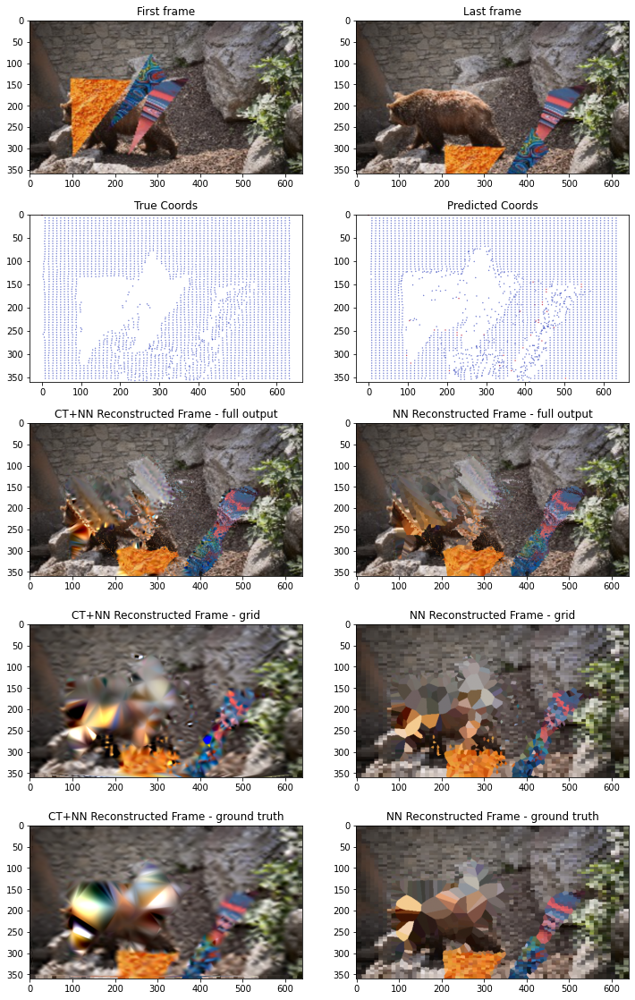

--------------------------------------------------------------------------------------------------------------------------------------------


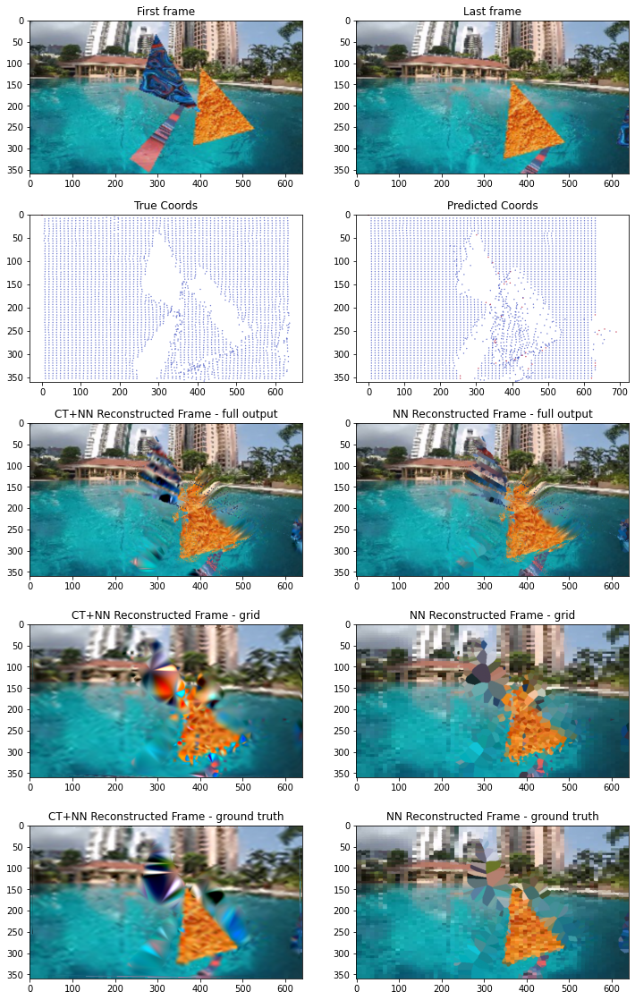

--------------------------------------------------------------------------------------------------------------------------------------------


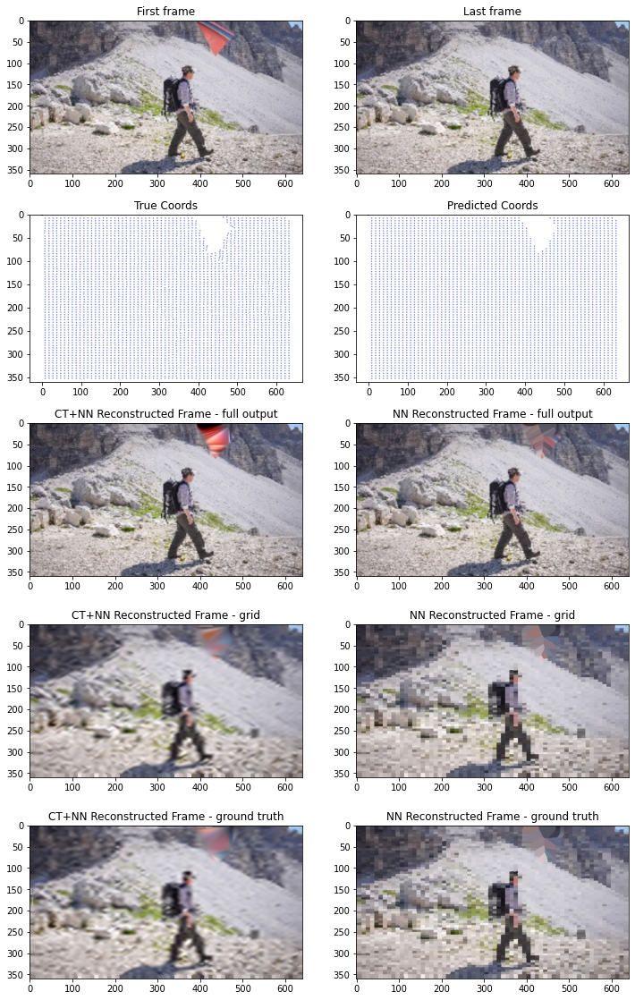

--------------------------------------------------------------------------------------------------------------------------------------------


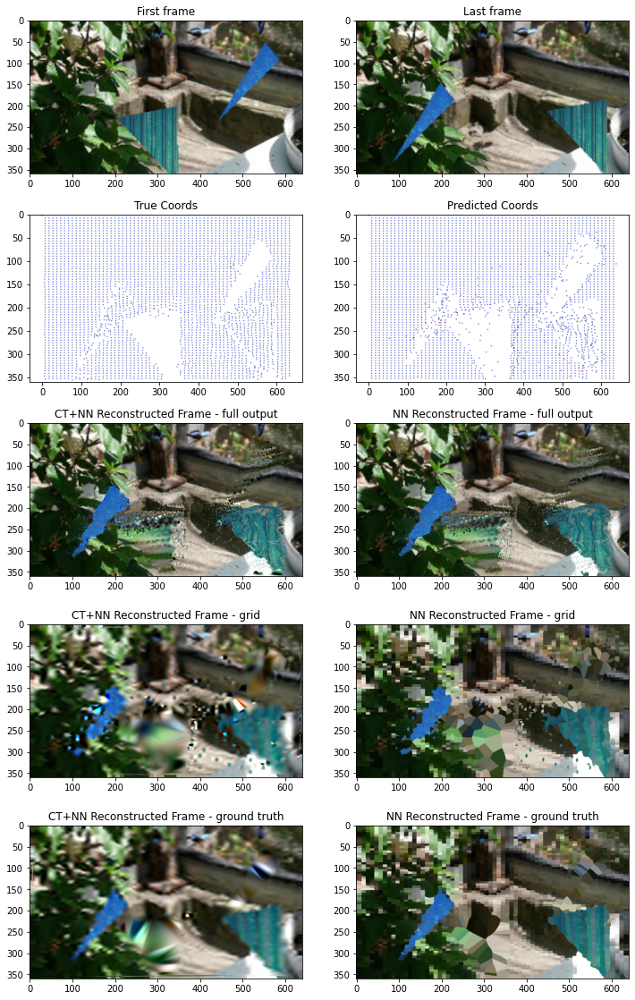

--------------------------------------------------------------------------------------------------------------------------------------------


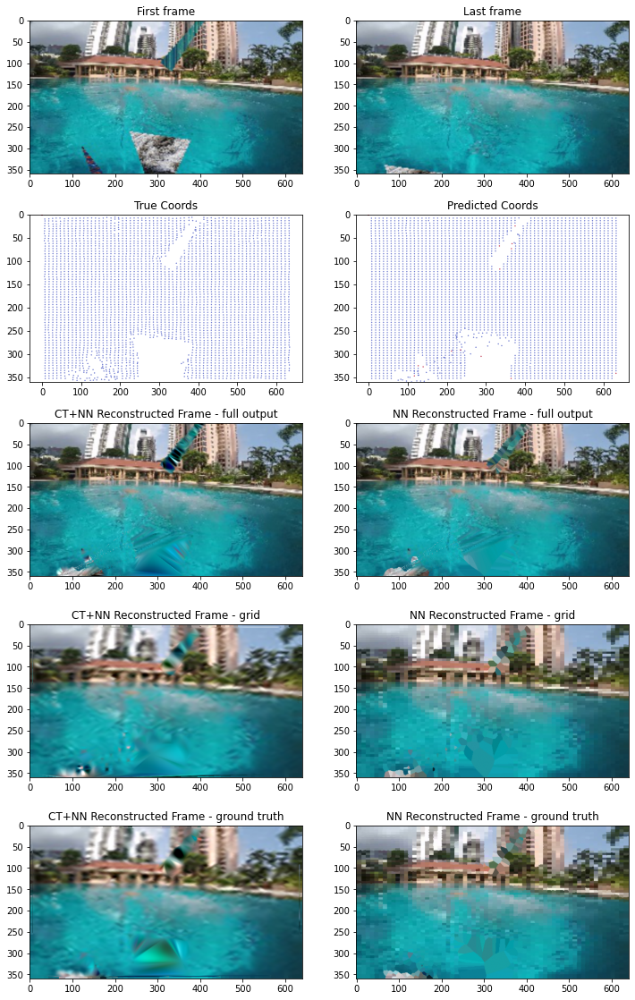

--------------------------------------------------------------------------------------------------------------------------------------------


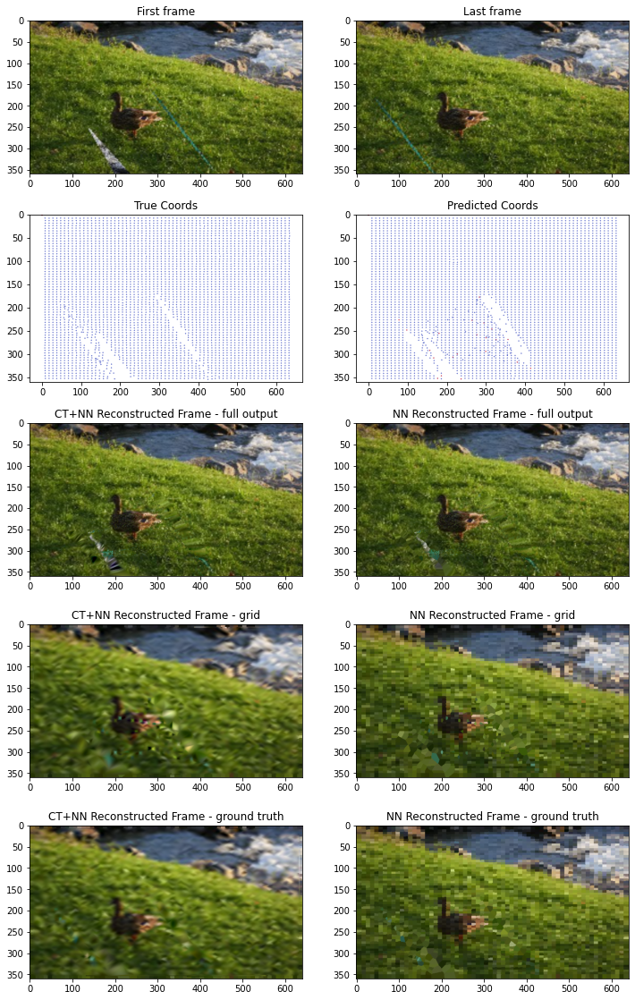

--------------------------------------------------------------------------------------------------------------------------------------------


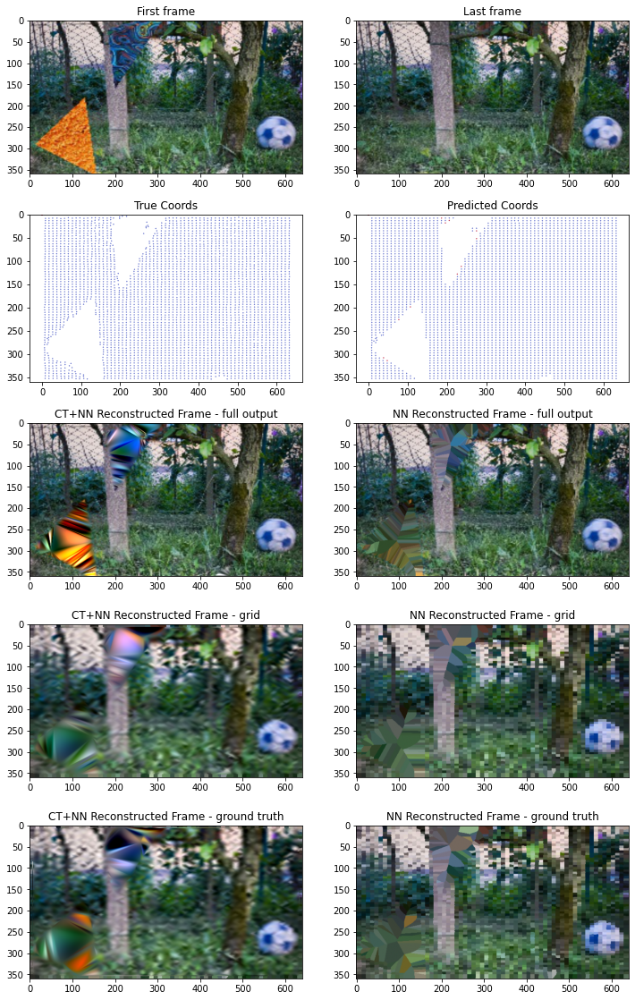

--------------------------------------------------------------------------------------------------------------------------------------------


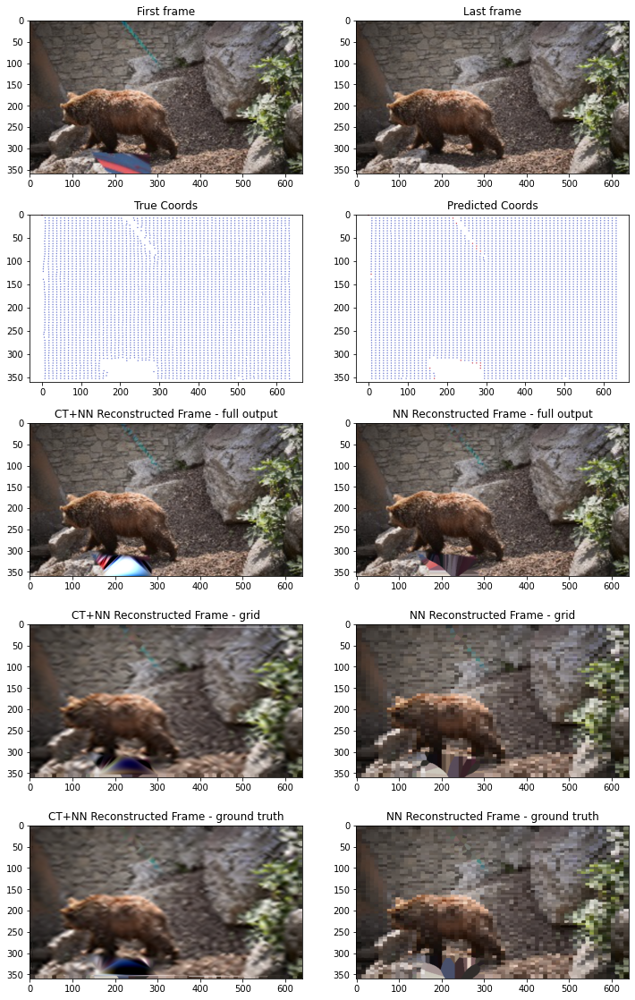

--------------------------------------------------------------------------------------------------------------------------------------------


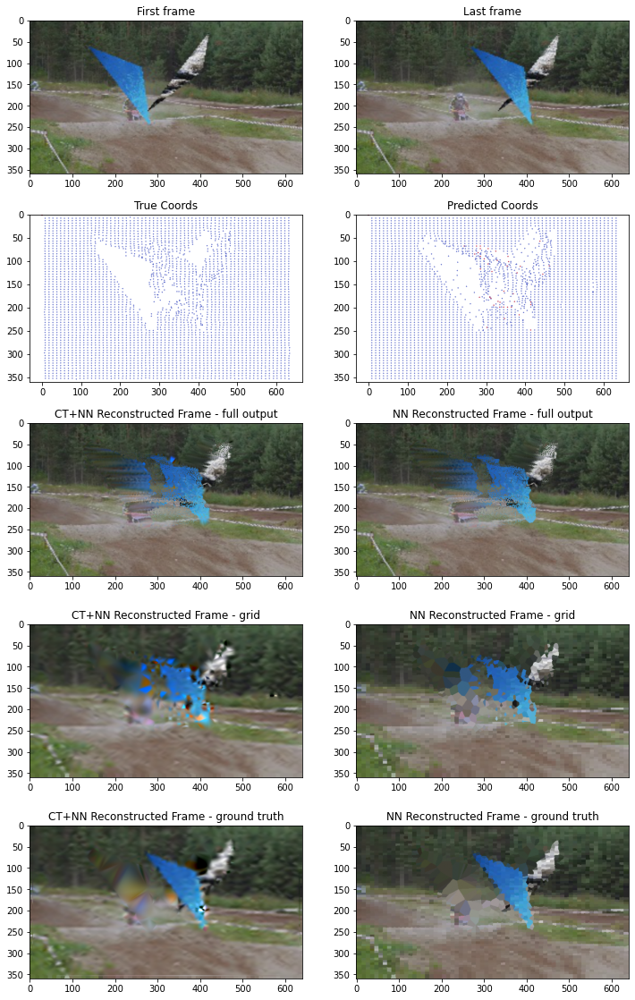

--------------------------------------------------------------------------------------------------------------------------------------------


In [16]:
model_weights, best_model_weights, t_history, v_history = load_checkpoint("augmented_checkpoint_2023-03-23_1505.pth")
plot_learning_curve(t_history, v_history)

# Set computation device
device = torch.device('cuda')

# MODEL INITIALISATION
model1 = initialise_model(device, to_learn=['all'])
model1.load_state_dict(best_model_weights)
model1.eval()
torch.save(model1, "model1C.pt")

# DEFINE HYPERPARAMETERS
shuffle_dataset = True
B = 16 # Batch size

# Get train and test dataloaders
test_loader = get_dataloader(test_dataset)

outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis = run_model(model1, test_loader)
show_results(outputs_coords_grid, outputs_vis_grid, coords, vis, input1, last_img, outputs_coords, outputs_vis)